In [24]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import  GridSearchCV
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import (RandomForestClassifier,
                              BaggingClassifier,
                              GradientBoostingClassifier,
                              )
from xgboost import XGBClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report ,accuracy_score ,  confusion_matrix

# Preprocessing

In [3]:
data_tra = pd.read_csv('../Decision Trees/pendigits-tra.csv')
data_tes = pd.read_csv('../Decision Trees/pendigits-tes.csv')

In [4]:
data_tra.head()

,47,100,27,81,57,37,26,0,0.1,23,56,53,100.1,90,40,98,8
0,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6,2
1,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0,1
2,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0,4
3,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0,1
4,100,100,88,99,49,74,17,47,0,16,37,0,73,16,20,20,6


In [5]:
data_tra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7493 entries, 0 to 7492
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0    47     7493 non-null   int64
 1   100     7493 non-null   int64
 2    27     7493 non-null   int64
 3    81     7493 non-null   int64
 4    57     7493 non-null   int64
 5    37     7493 non-null   int64
 6    26     7493 non-null   int64
 7     0     7493 non-null   int64
 8     0.1   7493 non-null   int64
 9    23     7493 non-null   int64
 10   56     7493 non-null   int64
 11   53     7493 non-null   int64
 12  100.1   7493 non-null   int64
 13   90     7493 non-null   int64
 14   40     7493 non-null   int64
 15   98     7493 non-null   int64
 16   8      7493 non-null   int64
dtypes: int64(17)
memory usage: 995.3 KB


In [6]:
data_tes.head()

,88,92,2,99,16,66,94,37,70,0,0.1,24,42,65,100,100.1,8
0,80,100,18,98,60,66,100,29,42,0,0,23,42,61,56,98,8
1,0,94,9,57,20,19,7,0,20,36,70,68,100,100,18,92,8
2,95,82,71,100,27,77,77,73,100,80,93,42,56,13,0,0,9
3,68,100,6,88,47,75,87,82,85,56,100,29,75,6,0,0,9
4,70,100,100,97,70,81,45,65,30,49,20,33,0,16,0,0,1


In [7]:
data_tes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3497 entries, 0 to 3496
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0    88     3497 non-null   int64
 1    92     3497 non-null   int64
 2     2     3497 non-null   int64
 3    99     3497 non-null   int64
 4    16     3497 non-null   int64
 5    66     3497 non-null   int64
 6    94     3497 non-null   int64
 7    37     3497 non-null   int64
 8    70     3497 non-null   int64
 9     0     3497 non-null   int64
 10    0.1   3497 non-null   int64
 11   24     3497 non-null   int64
 12   42     3497 non-null   int64
 13   65     3497 non-null   int64
 14  100     3497 non-null   int64
 15  100.1   3497 non-null   int64
 16   8      3497 non-null   int64
dtypes: int64(17)
memory usage: 464.6 KB


In [8]:
cols = [f"f{i}" for i in range(1, 17)] + ['target']
data_tra.columns = cols
data_tes.columns = cols


In [9]:
data_tra.head()

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,target
0,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6,2
1,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0,1
2,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0,4
3,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0,1
4,100,100,88,99,49,74,17,47,0,16,37,0,73,16,20,20,6


In [10]:
data_tra.describe()

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,target
count,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000
mean,37.383024,84.677299,40.007340,82.889764,50.877486,65.048178,51.475244,44.605632,57.137595,34.070599,61.418124,35.779794,54.693714,35.793541,46.814627,28.556119,4.430402
std,33.324063,16.848615,26.257347,19.639880,34.929460,27.377250,30.680711,30.657194,33.676120,27.461524,37.133187,27.496951,22.595228,33.219926,41.534491,35.804498,2.876877
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,76.000000,20.000000,70.000000,17.000000,48.000000,28.000000,22.000000,30.000000,7.000000,25.000000,12.000000,41.000000,7.000000,0.000000,0.000000,2.000000
50%,31.000000,89.000000,39.000000,89.000000,56.000000,71.000000,54.000000,42.000000,60.000000,33.000000,74.000000,32.000000,53.000000,28.000000,39.000000,8.000000,4.000000
75%,61.000000,100.000000,58.000000,100.000000,81.000000,86.000000,75.000000,65.000000,88.000000,55.000000,98.000000,57.000000,69.000000,48.000000,100.000000,51.000000,7.000000
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,9.000000


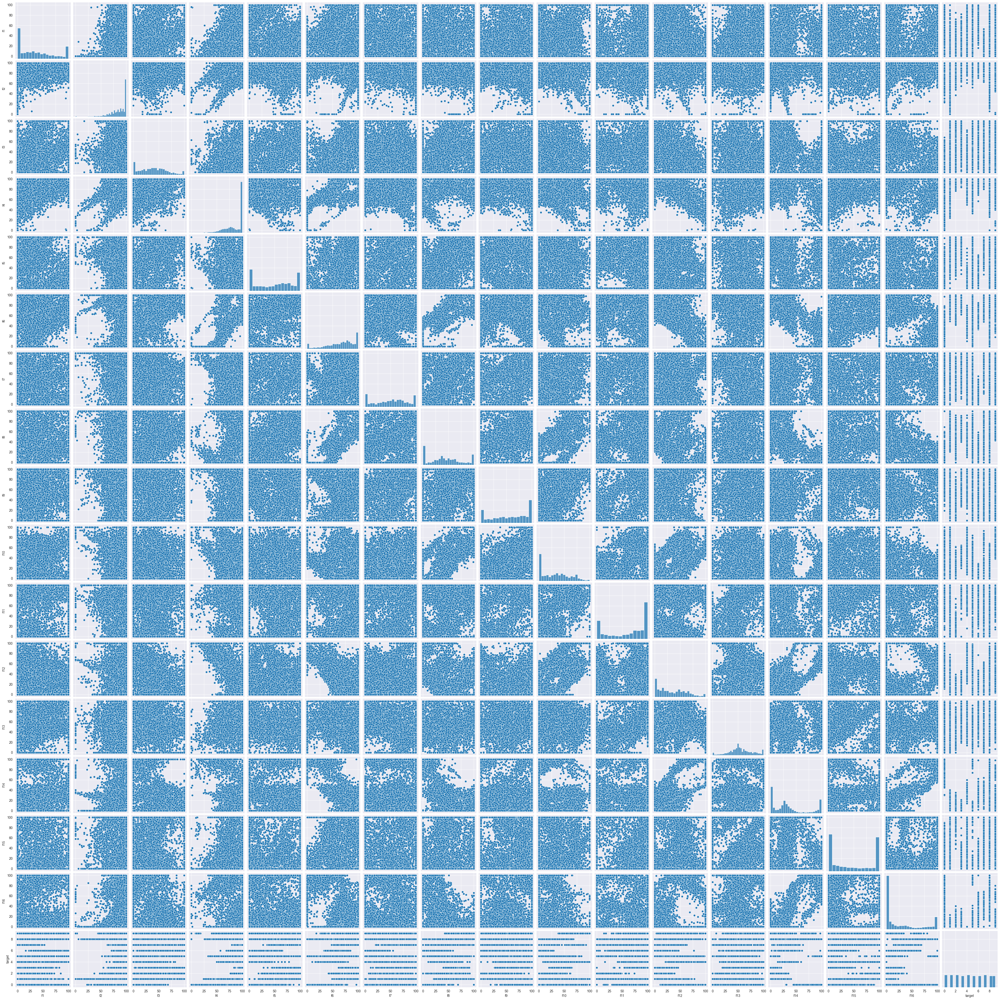

In [11]:
sns.pairplot(data=data_tra)
plt.show()

In [12]:
data_tra.corr().round(2)

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,target
f1,1.00,0.34,0.26,0.12,-0.45,-0.11,-0.41,-0.13,-0.05,-0.11,0.20,-0.09,0.16,-0.01,-0.35,0.03,0.36
f2,0.34,1.00,-0.10,0.26,-0.32,-0.23,-0.35,-0.39,-0.10,-0.34,0.13,-0.07,0.14,0.10,-0.11,0.11,0.22
f3,0.26,-0.10,1.00,0.44,0.42,0.46,-0.16,0.30,-0.15,-0.04,-0.04,-0.46,-0.16,-0.48,-0.14,-0.32,0.26
f4,0.12,0.26,0.44,1.00,0.19,0.66,-0.04,0.24,-0.16,-0.31,-0.17,-0.73,-0.08,-0.63,0.11,-0.38,0.19
f5,-0.45,-0.32,0.42,0.19,1.00,0.48,0.45,0.38,-0.24,0.07,-0.34,-0.31,-0.33,-0.29,0.05,-0.12,0.04
f6,-0.11,-0.23,0.46,0.66,0.48,1.00,0.19,0.78,-0.04,0.15,-0.14,-0.63,-0.16,-0.79,0.08,-0.59,0.17
f7,-0.41,-0.35,-0.16,-0.04,0.45,0.19,1.00,0.38,0.41,0.35,-0.19,0.09,-0.37,-0.08,0.05,-0.10,-0.19
f8,-0.13,-0.39,0.30,0.24,0.38,0.78,0.38,1.00,0.28,0.66,0.10,-0.23,-0.11,-0.71,-0.13,-0.70,0.11
f9,-0.05,-0.10,-0.15,-0.16,-0.24,-0.04,0.41,0.28,1.00,0.51,0.59,0.28,-0.06,-0.10,-0.37,-0.27,-0.22
f10,-0.11,-0.34,-0.04,-0.31,0.07,0.15,0.35,0.66,0.51,1.00,0.35,0.48,0.04,-0.20,-0.31,-0.43,-0.06


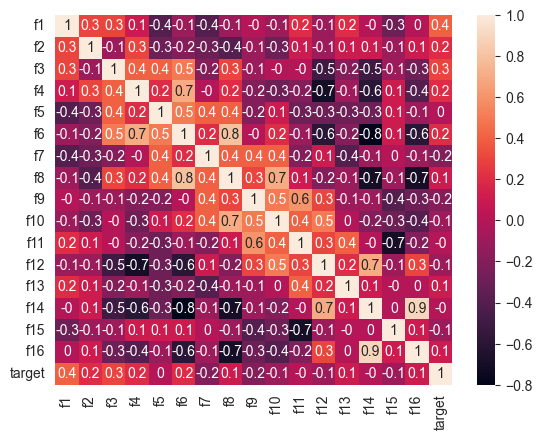

In [13]:
sns.heatmap(data_tra.corr().round(1) ,annot =True);

### `summary`
* There is no clear relationship between any single feature and the target.
* The strongest relationship between the target was with f1 = 0.4.
* The weakest relationship with the target was f5, f14 = +-0.04.
* The relationship between features varies from very small to very high.

In [14]:
data_tra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7493 entries, 0 to 7492
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   f1      7493 non-null   int64
 1   f2      7493 non-null   int64
 2   f3      7493 non-null   int64
 3   f4      7493 non-null   int64
 4   f5      7493 non-null   int64
 5   f6      7493 non-null   int64
 6   f7      7493 non-null   int64
 7   f8      7493 non-null   int64
 8   f9      7493 non-null   int64
 9   f10     7493 non-null   int64
 10  f11     7493 non-null   int64
 11  f12     7493 non-null   int64
 12  f13     7493 non-null   int64
 13  f14     7493 non-null   int64
 14  f15     7493 non-null   int64
 15  f16     7493 non-null   int64
 16  target  7493 non-null   int64
dtypes: int64(17)
memory usage: 995.3 KB


In [15]:
print(data_tra.isnull().sum().sum())
print(data_tes.isnull().sum().sum())

0
0


In [16]:
print(data_tra.duplicated().sum().sum())
print(data_tes.duplicated().sum().sum())

0
0


In [17]:
data_tra['target'].value_counts()

target
2    780
4    780
0    780
1    779
7    778
6    720
5    720
9    719
3    719
8    718
Name: count, dtype: int64

In [18]:
X_train = data_tra.drop('target', axis=1)
y_train = data_tra['target']

X_test = data_tes.drop('target', axis=1)
y_test = data_tes['target']

# Decision tree

In [36]:
dt = DecisionTreeClassifier()
dt.fit(X_train , y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


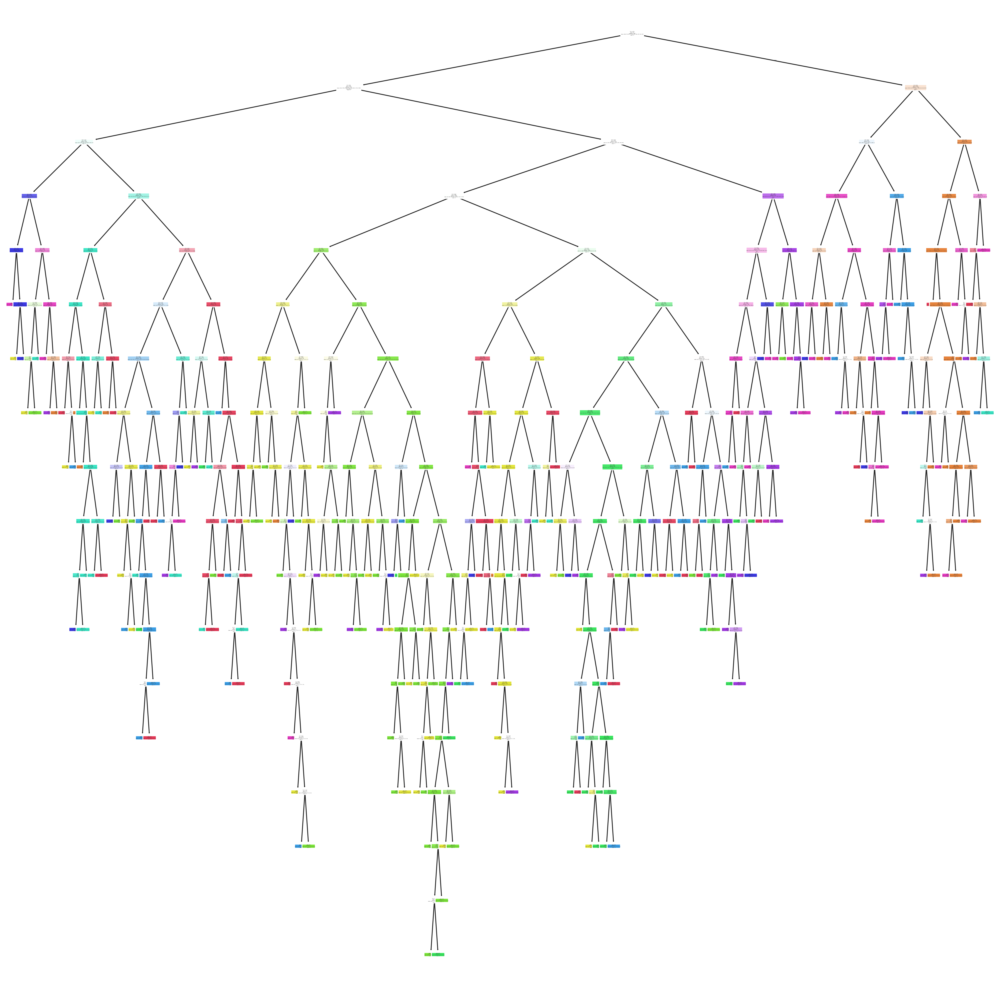

In [44]:
plt.figure(figsize=(20,20) ,dpi=400)
plot_tree(dt
          ,feature_names= data_tra.columns
          ,class_names= [str(i) for i in np.unique(y_train)]
          ,filled=True,
          rounded=True)
plt.show()

In [45]:
y_pred_dt = dt.predict(X_test)

In [81]:
print("Classification report = \n",classification_report(y_test, y_pred_dt))

Classification report = 
               precision    recall  f1-score   support

           0       0.96      0.96      0.96       363
           1       0.86      0.88      0.87       364
           2       0.87      0.94      0.90       364
           3       0.89      0.93      0.91       336
           4       0.90      0.96      0.93       364
           5       0.94      0.86      0.90       335
           6       0.97      0.95      0.96       336
           7       0.93      0.85      0.89       364
           8       0.93      0.91      0.92       335
           9       0.95      0.92      0.93       336

    accuracy                           0.92      3497
   macro avg       0.92      0.92      0.92      3497
weighted avg       0.92      0.92      0.92      3497



In [82]:
print("Accuracy = ",accuracy_score(y_test, y_pred_dt))
print("Confusion Matrix = \n",confusion_matrix(y_test, y_pred_dt))

Accuracy =  0.9179296539891335
Confusion Matrix = 
 [[350   0   1   0   0   0   1   1  10   0]
 [  0 322  38   2   1   0   0   1   0   0]
 [  0  14 342   0   0   3   2   2   0   1]
 [  0  12   5 314   0   3   0   0   0   2]
 [  0   2   0   1 351   4   5   0   0   1]
 [  0   2   1  26   2 288   0   0   5  11]
 [  2   0   2   0   7   3 319   0   2   1]
 [  0  14   4   7  24   0   0 311   4   0]
 [ 11   1   0   0   0   2   1  15 305   0]
 [  0   6   0   4   4   5   1   6   2 308]]


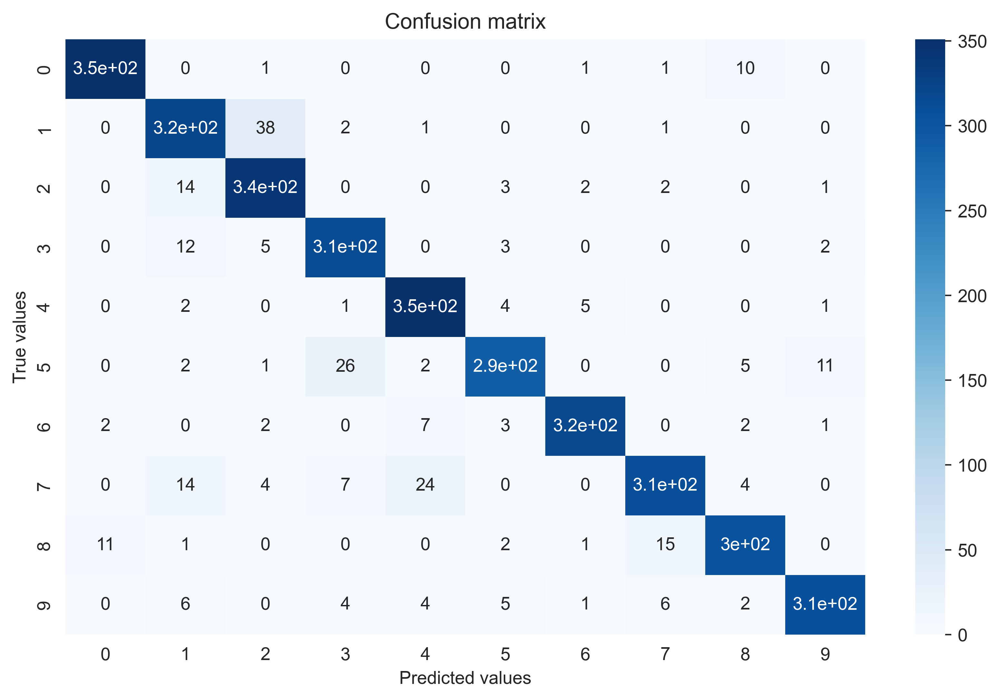

In [55]:
plt.figure(figsize=(10,6) ,dpi=400)
sns.heatmap(confusion_matrix(y_test, y_pred_dt), annot=True,cmap="Blues")
plt.xlabel('Predicted values')
plt.ylabel('True values')
plt.title('Confusion matrix')
plt.show()

In [75]:
param = {'max_depth': [10, 12, 14, 17,None],
         'min_samples_split': [2, 3, 5],
         'min_samples_leaf': [1, 2, 4],
         }

grid = GridSearchCV(dt, param, cv=5, scoring='accuracy')

In [76]:
grid.fit(X_train , y_train)

,estimator,DecisionTreeClassifier()
,param_grid,"{'max_depth': [10, 12, ...], 'min_samples_leaf': [1, 2, ...], 'min_samples_split': [2, 3, ...]}"
,scoring,'accuracy'
,n_jobs,None
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,criterion,'gini'


In [77]:
print("Best Parameters:", grid.best_params_)
print("Best Score:", grid.best_score_)

Best Parameters: {'max_depth': 14, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best Score: 0.9616980078396724


In [79]:
best_dt = DecisionTreeClassifier(max_depth=14, min_samples_split=2, min_samples_leaf=1, random_state=42)
best_dt.fit(X_train, y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,14
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,42
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


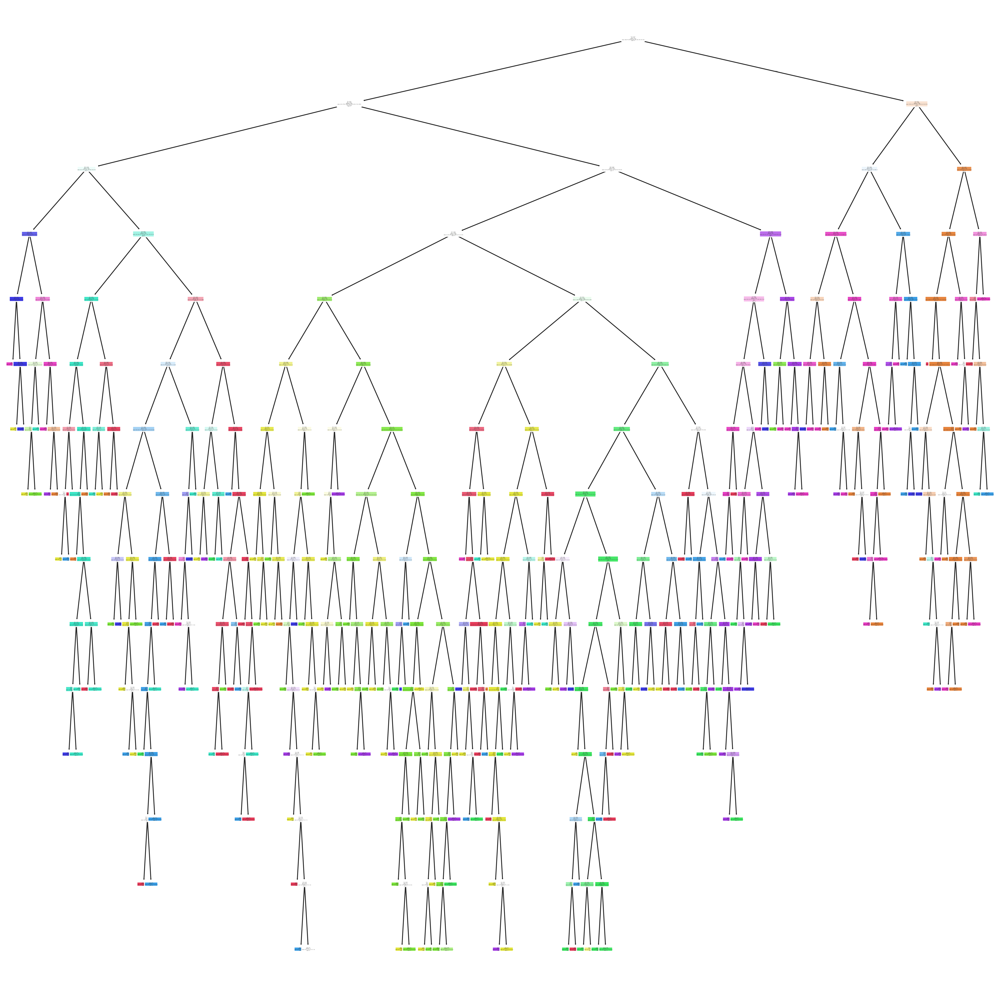

In [80]:
plt.figure(figsize=(20,20) ,dpi=400)
plot_tree(best_dt
          ,feature_names= data_tra.columns
          ,class_names= [str(i) for i in np.unique(y_train)]
          ,filled=True,
          rounded=True)
plt.show()

In [83]:
y_pred_best_dt = best_dt.predict(X_test)

In [84]:
print("Classification report = \n",classification_report(y_test, y_pred_best_dt))

Classification report = 
               precision    recall  f1-score   support

           0       0.95      0.96      0.95       363
           1       0.85      0.88      0.86       364
           2       0.88      0.96      0.92       364
           3       0.88      0.93      0.90       336
           4       0.91      0.97      0.94       364
           5       0.95      0.82      0.88       335
           6       0.98      0.94      0.96       336
           7       0.91      0.86      0.88       364
           8       0.93      0.90      0.92       335
           9       0.94      0.93      0.94       336

    accuracy                           0.92      3497
   macro avg       0.92      0.91      0.92      3497
weighted avg       0.92      0.92      0.91      3497



In [85]:
print("Accuracy = ",accuracy_score(y_test, y_pred_best_dt))
print("Confusion Matrix = \n",confusion_matrix(y_test, y_pred_best_dt))

Accuracy =  0.9150700600514727
Confusion Matrix = 
 [[348   1   0   0   1   0   1   1  11   0]
 [  0 321  38   1   1   1   0   2   0   0]
 [  0  10 349   0   0   2   1   2   0   0]
 [  1  15   2 311   0   4   0   3   0   0]
 [  0   1   0   3 353   1   4   0   0   2]
 [  0   3   1  27   7 275   0   1   5  16]
 [  9   6   1   0   0   0 316   1   3   0]
 [  0  14   4   8  24   0   0 312   2   0]
 [  9   0   0   0   0   4   1  17 303   1]
 [  1   8   0   4   1   2   0   5   3 312]]


### `summary`
* Using GridSearchCV to get the best parameter, the accuracy is still very close.
### But in general, if you want to simplify the model,
 * increasing the min_* hyperparameters
  * or reducing the max_* hyperparameters .

# Bagging

## Bagging of SVM

In [20]:
bag_svm = BaggingClassifier(SVC(), n_jobs=-1, random_state=42)
bag_svm.fit(X_train, y_train)

,estimator,SVC()
,n_estimators,10
,max_samples,1.0
,max_features,1.0
,bootstrap,True
,bootstrap_features,False
,oob_score,False
,warm_start,False
,n_jobs,-1
,random_state,42
,verbose,0


In [21]:
y_pred_bag_svm = bag_svm.predict(X_test)

In [22]:
print("Accuracy score = ", accuracy_score(y_test, y_pred_bag_svm))
print("Confusion matrix  = ", confusion_matrix(y_test, y_pred_bag_svm))
print("Classification report = \n",classification_report(y_test, y_pred_bag_svm))

Accuracy score =  0.9802688018301401
Confusion matrix  =  [[352   0   0   0   0   0   0   0  11   0]
 [  0 350  13   0   1   0   0   0   0   0]
 [  0   2 362   0   0   0   0   0   0   0]
 [  0   1   0 333   0   0   0   0   0   2]
 [  0   0   0   0 359   4   1   0   0   0]
 [  0   0   0   5   0 329   0   0   0   1]
 [  0   1   0   0   0   0 335   0   0   0]
 [  0  13   2   0   0   0   0 345   0   4]
 [  0   1   0   0   0   1   0   0 333   0]
 [  0   2   0   0   0   0   0   3   1 330]]
Classification report = 
               precision    recall  f1-score   support

           0       1.00      0.97      0.98       363
           1       0.95      0.96      0.95       364
           2       0.96      0.99      0.98       364
           3       0.99      0.99      0.99       336
           4       1.00      0.99      0.99       364
           5       0.99      0.98      0.98       335
           6       1.00      1.00      1.00       336
           7       0.99      0.95      0.97       36

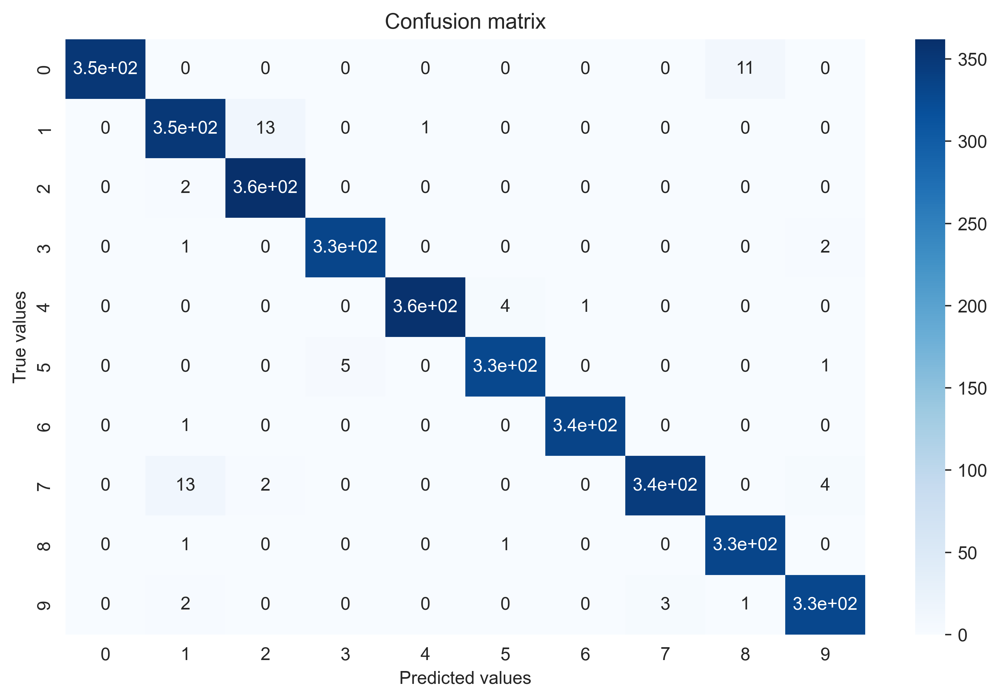

In [23]:
plt.figure(figsize=(10,6) ,dpi=400)
sns.heatmap(confusion_matrix(y_test, y_pred_bag_svm), annot=True,cmap="Blues")
plt.xlabel('Predicted values')
plt.ylabel('True values')
plt.title('Confusion matrix')
plt.show()

## Bagging of DT

In [24]:
bag_dt = BaggingClassifier(DecisionTreeClassifier(), n_jobs=-1, random_state=42)
bag_dt.fit(X_train, y_train)

,estimator,DecisionTreeClassifier()
,n_estimators,10
,max_samples,1.0
,max_features,1.0
,bootstrap,True
,bootstrap_features,False
,oob_score,False
,warm_start,False
,n_jobs,-1
,random_state,42
,verbose,0


In [25]:
y_pred_bag_dt = bag_dt.predict(X_test)

In [28]:
print("Accuracy score = ", accuracy_score(y_test, y_pred_bag_dt))
print("Confusion matrix  = ", confusion_matrix(y_test, y_pred_bag_dt))
print("Classification report = \n",classification_report(y_test, y_pred_bag_dt))

Accuracy score =  0.9453817557906777
Confusion matrix  =  [[351   0   0   0   0   0   0   0  12   0]
 [  0 330  30   4   0   0   0   0   0   0]
 [  0   8 353   0   0   0   1   2   0   0]
 [  0   7   0 328   0   0   0   0   0   1]
 [  0   2   2   1 352   1   4   0   0   2]
 [  0   3   0  11   8 300   0   1   4   8]
 [  2   5   0   0   3   1 324   0   1   0]
 [  0  39   3   3   1   0   1 315   2   0]
 [  2   1   0   0   0   0   0   0 332   0]
 [  0   7   0   2   1   0   1   3   1 321]]
Classification report = 
               precision    recall  f1-score   support

           0       0.99      0.97      0.98       363
           1       0.82      0.91      0.86       364
           2       0.91      0.97      0.94       364
           3       0.94      0.98      0.96       336
           4       0.96      0.97      0.97       364
           5       0.99      0.90      0.94       335
           6       0.98      0.96      0.97       336
           7       0.98      0.87      0.92       36

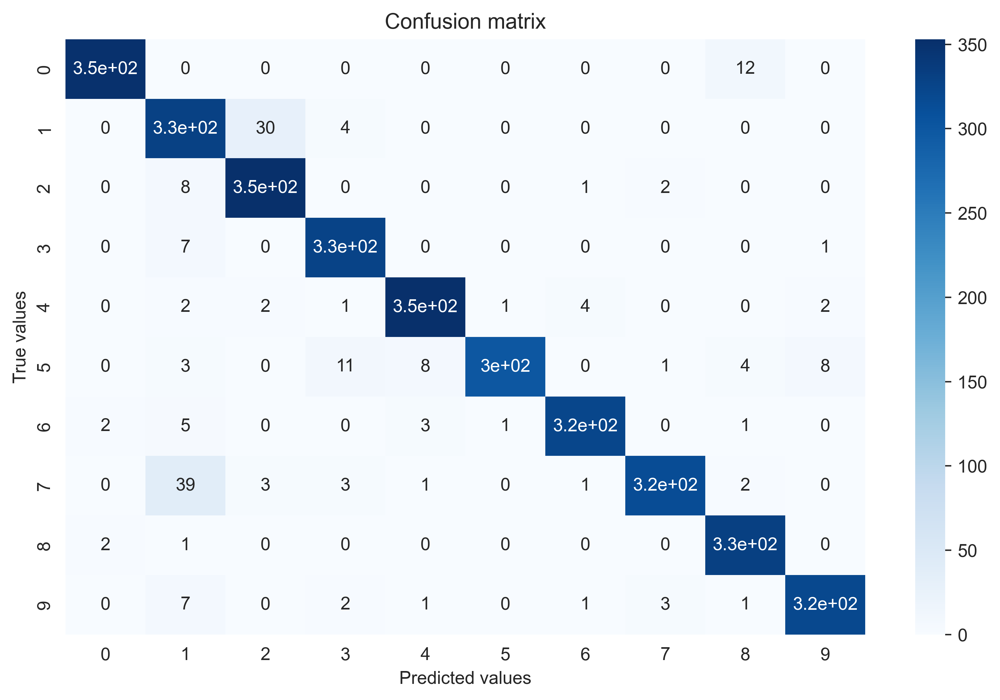

In [27]:
plt.figure(figsize=(10,6) ,dpi=400)
sns.heatmap(confusion_matrix(y_test, y_pred_bag_dt), annot=True,cmap="Blues")
plt.xlabel('Predicted values')
plt.ylabel('True values')
plt.title('Confusion matrix')
plt.show()

## Random Forest

In [29]:
rnf = RandomForestClassifier(random_state=42)
rnf.fit(X_train, y_train)

,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [30]:
y_pred_rnf = rnf.predict(X_test)
score =  accuracy_score(y_test, y_pred_rnf)
print("Accuracy score = ", score)

Accuracy score =  0.9668287103231341


In [31]:
n_estimators_list = [10, 50, 100, 150, 200]
acc_scores = []

for n in n_estimators_list:
    rnf_clf = RandomForestClassifier(n_estimators=n, random_state=42)
    rnf_clf.fit(X_train, y_train)
    y_pred_rnf_clf = rnf_clf.predict(X_test)
    acc = accuracy_score(y_test, y_pred_rnf_clf)
    acc_scores.append(acc)

In [33]:
acc_scores


[0.9548184157849585,
 0.963111238204175,
 0.9668287103231341,
 0.9648269945667716,
 0.9651129539605376]

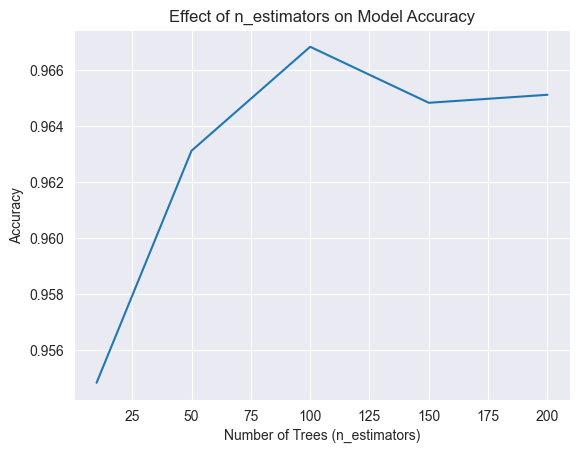

In [37]:
sns.lineplot(x=n_estimators_list, y=acc_scores)
plt.xlabel("Number of Trees (n_estimators)")
plt.ylabel("Accuracy")
plt.title("Effect of n_estimators on Model Accuracy")
plt.show()

# Boosting

## GradientBoosting

In [40]:
n_estimators_list = [10, 50, 100, 150, 200]
acc_scores = []

for n in n_estimators_list:
    grb = GradientBoostingClassifier(n_estimators=n, random_state=42)
    grb.fit(X_train, y_train)
    y_pred_grb = grb.predict(X_test)
    acc = accuracy_score(y_test, y_pred_grb)
    acc_scores.append(acc)
    print("if number of estimators = ", n, "then the accuracy = ", acc)

if number of estimators =  10 then the accuracy =  0.8730340291678582
if number of estimators =  50 then the accuracy =  0.9499571060909351
if number of estimators =  100 then the accuracy =  0.9619674006291107
if number of estimators =  150 then the accuracy =  0.9648269945667716
if number of estimators =  200 then the accuracy =  0.9656848727480698


In [41]:
learning_rate_list = [0.1, 0.3, 0.5, 0.7, 0.9]
acc_scores = []

for l in learning_rate_list:
    grb = GradientBoostingClassifier(n_estimators=200, learning_rate=l, random_state=42)
    grb.fit(X_train, y_train)
    y_pred_grb = grb.predict(X_test)
    acc = accuracy_score(y_test, y_pred_grb)
    acc_scores.append(acc)
    print("if learning rate = ", l, "then the accuracy = ", acc)

if learning rate =  0.1 then the accuracy =  0.9656848727480698
if learning rate =  0.3 then the accuracy =  0.9653989133543037
if learning rate =  0.5 then the accuracy =  0.25221618530168716
if learning rate =  0.7 then the accuracy =  0.027166142407778097
if learning rate =  0.9 then the accuracy =  0.1970260223048327


In [42]:
best_grb = GradientBoostingClassifier(n_estimators=200,
                                      learning_rate=0.1, random_state=42)
best_grb.fit(X_train, y_train)

,loss,'log_loss'
,learning_rate,0.1
,n_estimators,200
,subsample,1.0
,criterion,'friedman_mse'
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_depth,3
,min_impurity_decrease,0.0
,init,None


In [43]:
y_pred_best_grb = best_grb.predict(X_test)

print("Accuracy = ", accuracy_score(y_test, y_pred_best_grb))
print("Confusion matrix = \n", confusion_matrix(y_test, y_pred_best_grb))

Accuracy =  0.9656848727480698
Confusion matrix = 
 [[343   0   0   0   0   0   0   0  20   0]
 [  0 345  17   0   1   1   0   0   0   0]
 [  0   2 362   0   0   0   0   0   0   0]
 [  0   2   0 332   0   0   0   1   0   1]
 [  0   0   0   0 364   0   0   0   0   0]
 [  0   0   0   6   0 310   1   0   4  14]
 [  0   0   0   0   0   1 335   0   0   0]
 [  0  25   4   0   0   0   0 327   0   8]
 [  0   0   0   0   0   0   0   0 335   0]
 [  0   5   0   5   0   0   0   1   1 324]]


In [19]:
grb = GradientBoostingClassifier(random_state=42)
param = {
    'n_estimators' : [10, 50, 100, 150, 200],
    'learning_rate': [0.1, 0.3, 0.5, 0.7, 0.9]
}

grid = GridSearchCV(grb, param, cv=5, scoring='accuracy')
grid.fit(X_train, y_train)

,estimator,GradientBoost...ndom_state=42)
,param_grid,"{'learning_rate': [0.1, 0.3, ...], 'n_estimators': [10, 50, ...]}"
,scoring,'accuracy'
,n_jobs,None
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,loss,'log_loss'


In [21]:
print("Best Parameters:", grid.best_params_)
print("Best Score:", grid.best_score_)

Best Parameters: {'learning_rate': 0.1, 'n_estimators': 200}
Best Score: 0.9911913683443613


## XGBoost

In [22]:
XGB = XGBClassifier(n_estimators=200, learning_rate=0.1, random_state=42)
XGB.fit(X_train, y_train)

,objective,'multi:softprob'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [23]:
y_pred_XGB = XGB.predict(X_test)

print("Accuracy = ", accuracy_score(y_test, y_pred_XGB))
print("Confusion matrix = \n", confusion_matrix(y_test, y_pred_XGB))

Accuracy =  0.9645410351730054
Confusion matrix = 
 [[343   0   0   0   0   0   0   0  20   0]
 [  0 341  22   0   0   0   0   1   0   0]
 [  0   1 362   0   0   0   0   1   0   0]
 [  0   3   0 331   0   0   0   1   0   1]
 [  0   2   0   0 361   0   0   1   0   0]
 [  0   1   0   5   0 318   1   0   2   8]
 [  0   0   1   0   0   2 333   0   0   0]
 [  0  20   2   2  12   0   0 327   0   1]
 [  2   0   0   0   0   0   0   0 333   0]
 [  0   4   0   6   0   0   0   1   1 324]]


## `summary`
**Bagging** :
* Parallel
* Each model trained on a random subset of the data
* Final prediction by voting (Classification)
* or averaging (Regression).
* Ex- Random Forest,



**Boosting** :
* Sequential
* Each new model focuses on errors made by previous ones.
* Final prediction by weighted voting (Classification)
* or weighted sum (Regression).
* Ex- AdaBoost, Gradient Boosting, XGBoost

# Improving with PCA and Feature Selection: